In [9]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image

# -----------------------------
# 로그 폴더
# -----------------------------
BASE_DIR = r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219"

# -----------------------------
# 맵 이미지 절대경로
# -----------------------------
MAP_IMAGES = {
    "Erangel": r"C:/Users/qkrtl/10th/00_Project/04_final/03_team_code/map_erangel.webp",
    "Miramar": r"C:/Users/qkrtl/10th/00_Project/04_final/03_team_code/map_mirarmar.webp",
    "Sanhok": r"C:/Users/qkrtl/10th/00_Project/04_final/03_team_code/map_sanhok.webp",
    "Taego": r"C:/Users/qkrtl/10th/00_Project/04_final/03_team_code/map_taego.webp",
    "Rondo": r"C:/Users/qkrtl/10th/00_Project/04_final/03_team_code/map_rondo.webp",
}

# -----------------------------
# 네가 이미지에서 수기로 찍은 픽셀 좌표
# 순서 = GAME_CONTROL_POINTS와 반드시 같아야 함
# -----------------------------
IMAGE_CONTROL_POINTS = {
    "Erangel": np.array([
        [510, 400],  # School
        [430, 500],  # Pochinki
        [550, 760],  # Military Base
    ], dtype=float),

    "Miramar": np.array([
        [450, 520],  # Pecado
        [200, 350],  # El Pozo
        [600, 700],  # Los Leones
    ], dtype=float),

    "Sanhok": np.array([
        [500, 470],  # Bootcamp
        [620, 340],  # Paradise
    ], dtype=float),

    "Taego": np.array([
        [410, 630],  # Ho San
        [600, 450],  # Terminal
    ], dtype=float),

    "Rondo": np.array([
        [200, 400],  # Jao Tin
        [950, 710],  # Jadena City
    ], dtype=float),
}

# -----------------------------
# 게임 좌표(대략값)
# 지금은 Erangel만 먼저 넣고,
# 나머지는 나중에 추가해도 됨
# -----------------------------
GAME_CONTROL_POINTS = {
    "Erangel": np.array([
        [470000, 470000],  # School 대략
        [370000, 400000],  # Pochinki 대략
        [520000, 150000],  # Military Base 대략
    ], dtype=float),

    # Miramar / Sanhok / Taego / Rondo는 나중에 추가
}

In [10]:
def load_map_image(map_name):
    img_fp = MAP_IMAGES[map_name]
    if not os.path.exists(img_fp):
        raise FileNotFoundError(f"맵 이미지 파일 없음: {img_fp}")
    return np.array(Image.open(img_fp))

def fit_affine(game_points, image_points):
    game_points = np.asarray(game_points, dtype=float)
    image_points = np.asarray(image_points, dtype=float)

    X = np.hstack([game_points, np.ones((len(game_points), 1))])

    ax, *_ = np.linalg.lstsq(X, image_points[:, 0], rcond=None)
    ay, *_ = np.linalg.lstsq(X, image_points[:, 1], rcond=None)

    A = np.vstack([ax, ay])   # shape (2, 3)
    return A

def transform_points(points, A):
    points = np.asarray(points, dtype=float)
    X = np.hstack([points, np.ones((len(points), 1))])
    return X @ A.T

def get_affine_for_map(map_name):
    if map_name not in IMAGE_CONTROL_POINTS:
        raise KeyError(f"{map_name}의 IMAGE_CONTROL_POINTS 없음")
    if map_name not in GAME_CONTROL_POINTS:
        raise KeyError(f"{map_name}의 GAME_CONTROL_POINTS 없음")

    image_points = IMAGE_CONTROL_POINTS[map_name]
    game_points = GAME_CONTROL_POINTS[map_name]

    if len(image_points) != len(game_points):
        raise ValueError(f"{map_name}: image/game 기준점 개수가 다름")

    return fit_affine(game_points, image_points)

In [11]:
def plot_drop_scatter_on_map_calibrated(map_name, sample_n=5000, figsize=(10, 10)):
    csv_fp = os.path.join(BASE_DIR, map_name, "LogParachuteLanding.csv")

    df = pd.read_csv(csv_fp, usecols=[
        "character_location_x",
        "character_location_y"
    ]).rename(columns={
        "character_location_x": "x",
        "character_location_y": "y"
    })

    df["x"] = pd.to_numeric(df["x"], errors="coerce")
    df["y"] = pd.to_numeric(df["y"], errors="coerce")
    df = df.dropna(subset=["x", "y"])

    if len(df) > sample_n:
        df = df.sample(sample_n, random_state=42)

    A = get_affine_for_map(map_name)
    pts_img = transform_points(df[["x", "y"]].values, A)

    img = load_map_image(map_name)

    plt.figure(figsize=figsize)
    plt.imshow(img, origin="lower")
    plt.scatter(pts_img[:, 0], pts_img[:, 1], s=2, alpha=0.25)
    plt.title(f"{map_name} - Drop Scatter")
    plt.xlim(0, img.shape[1])
    plt.ylim(img.shape[0], 0)
    plt.show()


def plot_drop_heatmap_on_map_calibrated(map_name, bins=180, chunksize=200_000, figsize=(10, 10)):
    csv_fp = os.path.join(BASE_DIR, map_name, "LogParachuteLanding.csv")

    A = get_affine_for_map(map_name)
    img = load_map_image(map_name)
    H, W = img.shape[0], img.shape[1]

    heatmap = np.zeros((bins, bins), dtype=np.float64)

    for chunk in pd.read_csv(csv_fp, usecols=["character_location_x", "character_location_y"], chunksize=chunksize):
        chunk = chunk.rename(columns={
            "character_location_x": "x",
            "character_location_y": "y"
        })

        chunk["x"] = pd.to_numeric(chunk["x"], errors="coerce")
        chunk["y"] = pd.to_numeric(chunk["y"], errors="coerce")
        chunk = chunk.dropna(subset=["x", "y"])

        if chunk.empty:
            continue

        pts_img = transform_points(chunk[["x", "y"]].values, A)

        mask = (
            (pts_img[:, 0] >= 0) & (pts_img[:, 0] <= W) &
            (pts_img[:, 1] >= 0) & (pts_img[:, 1] <= H)
        )
        pts_img = pts_img[mask]

        if len(pts_img) == 0:
            continue

        h, _, _ = np.histogram2d(
            pts_img[:, 0],
            pts_img[:, 1],
            bins=[np.linspace(0, W, bins + 1), np.linspace(0, H, bins + 1)]
        )
        heatmap += h

    plt.figure(figsize=figsize)
    plt.imshow(img, origin="lower")
    plt.imshow(
        np.log1p(heatmap).T,
        extent=[0, W, H, 0],
        cmap="gray",
        alpha=0.55,
        aspect="equal"
    )
    plt.title(f"{map_name} - Drop Heatmap")
    plt.xlim(0, W)
    plt.ylim(H, 0)
    plt.show()


def plot_path_heatmap_on_map_calibrated(map_name, bins=220, chunksize=300_000, figsize=(10, 10)):
    csv_fp = os.path.join(BASE_DIR, map_name, "LogPlayerPosition.csv")

    A = get_affine_for_map(map_name)
    img = load_map_image(map_name)
    H, W = img.shape[0], img.shape[1]

    heatmap = np.zeros((bins, bins), dtype=np.float64)

    for chunk in pd.read_csv(csv_fp, usecols=["character_location_x", "character_location_y"], chunksize=chunksize):
        chunk = chunk.rename(columns={
            "character_location_x": "x",
            "character_location_y": "y"
        })

        chunk["x"] = pd.to_numeric(chunk["x"], errors="coerce")
        chunk["y"] = pd.to_numeric(chunk["y"], errors="coerce")
        chunk = chunk.dropna(subset=["x", "y"])

        if chunk.empty:
            continue

        pts_img = transform_points(chunk[["x", "y"]].values, A)

        mask = (
            (pts_img[:, 0] >= 0) & (pts_img[:, 0] <= W) &
            (pts_img[:, 1] >= 0) & (pts_img[:, 1] <= H)
        )
        pts_img = pts_img[mask]

        if len(pts_img) == 0:
            continue

        h, _, _ = np.histogram2d(
            pts_img[:, 0],
            pts_img[:, 1],
            bins=[np.linspace(0, W, bins + 1), np.linspace(0, H, bins + 1)]
        )
        heatmap += h

    plt.figure(figsize=figsize)
    plt.imshow(img, origin="lower")
    plt.imshow(
        np.log1p(heatmap).T,
        extent=[0, W, H, 0],
        cmap="gray",
        alpha=0.60,
        aspect="equal"
    )
    plt.title(f"{map_name} - Path Heatmap")
    plt.xlim(0, W)
    plt.ylim(H, 0)
    plt.show()

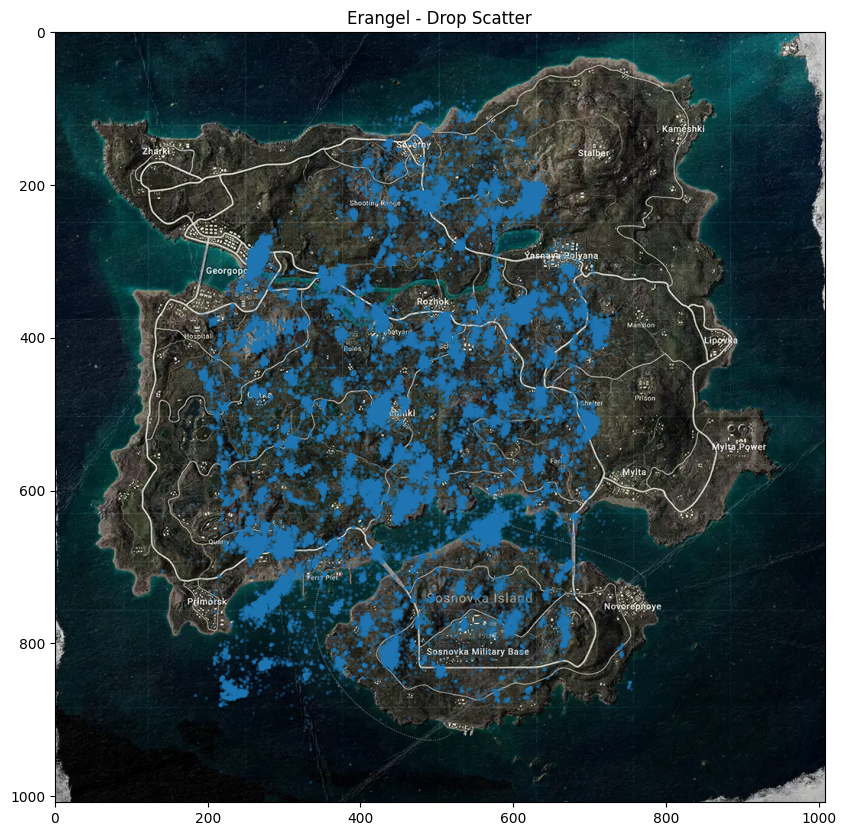

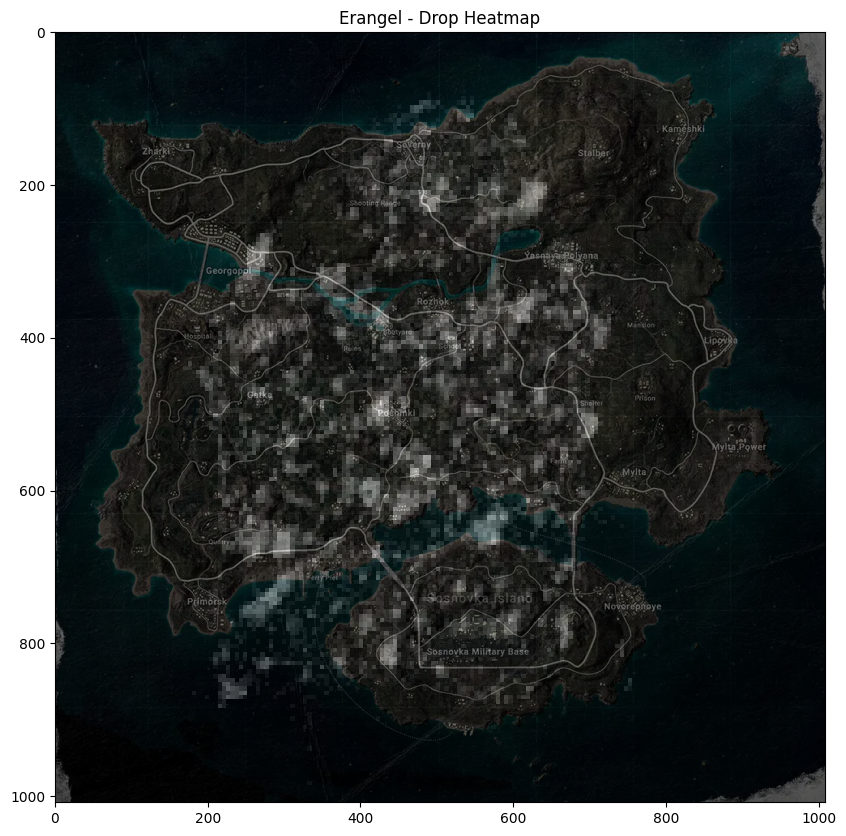

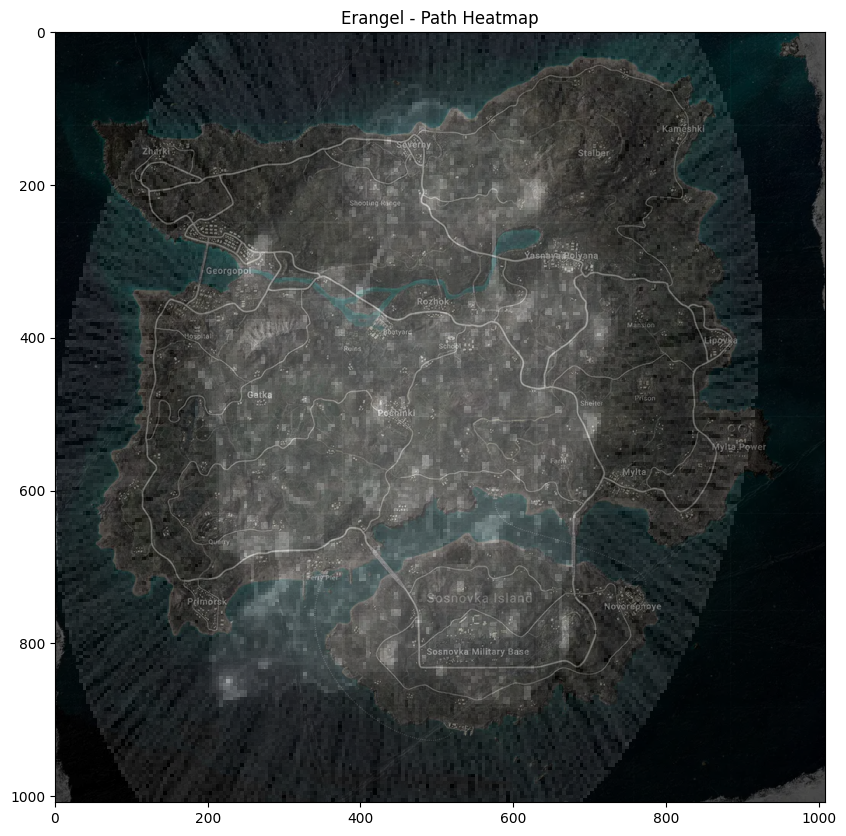

In [12]:
plot_drop_scatter_on_map_calibrated("Erangel", sample_n=200000)
plot_drop_heatmap_on_map_calibrated("Erangel", bins=180)
plot_path_heatmap_on_map_calibrated("Erangel", bins=220)

In [ ]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# =========================================================
# 1. 파일 경로 설정
# =========================================================
MAP_LOG_PATHS = {
    "Erangel": {
        "position": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Erangel/LogPlayerPosition.csv",
        "parachute": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Erangel/LogParachuteLanding.csv",
    },
    "Miramar": {
        "position": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Miramar/LogPlayerPosition.csv",
        "parachute": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Miramar/LogParachuteLanding.csv",
    },
    "Rondo": {
        "position": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Rondo/LogPlayerPosition.csv",
        "parachute": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Rondo/LogParachuteLanding.csv",
    },
    "Sanhok": {
        "position": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Sanhok/LogPlayerPosition.csv",
        "parachute": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Sanhok/LogParachuteLanding.csv",
    },
    "Taego": {
        "position": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Taego/LogPlayerPosition.csv",
        "parachute": r"C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/03_mapwise_logs_kakao+steam_20260211_20260219/Taego/LogParachuteLanding.csv",
    },
}

# =========================================================
# 2. 맵별 좌표 범위
# =========================================================
MAP_LIMITS = {
    "Erangel": (0, 800000, 0, 800000),
    "Miramar": (0, 800000, 0, 800000),
    "Rondo":   (0, 800000, 0, 800000),
    "Sanhok":  (0, 400000, 0, 400000),
    "Taego":   (0, 800000, 0, 800000),
}

# =========================================================
# 3. 컬럼명
# =========================================================
XCOL = "character_location_x"
YCOL = "character_location_y"

# =========================================================
# 4. CSV 불러오기 함수
# =========================================================
def load_single_log_csv(path, map_name, log_type):
    if not os.path.exists(path):
        print(f"[ERROR] 파일 없음: {path}")
        return pd.DataFrame()

    try:
        df = pd.read_csv(path)
        df["mapName"] = map_name
        df["logType"] = log_type
        print(f"[OK] loaded: {map_name} / {log_type} / shape={df.shape}")
        return df
    except Exception as e:
        print(f"[ERROR] load 실패: {path}")
        print(e)
        return pd.DataFrame()


def load_all_logs(map_log_paths):
    position_list = []
    parachute_list = []

    for map_name, paths in map_log_paths.items():
        df_pos = load_single_log_csv(paths["position"], map_name, "position")
        df_para = load_single_log_csv(paths["parachute"], map_name, "parachute")

        if not df_pos.empty:
            position_list.append(df_pos)
        if not df_para.empty:
            parachute_list.append(df_para)

    df_position = pd.concat(position_list, ignore_index=True) if position_list else pd.DataFrame()
    df_parachute = pd.concat(parachute_list, ignore_index=True) if parachute_list else pd.DataFrame()

    return df_position, df_parachute


# =========================================================
# 5. 기본 점검 함수
# =========================================================
def inspect_basic(df, name="df"):
    print(f"\n===== {name} =====")
    print("shape:", df.shape)
    print("columns:", df.columns.tolist()[:20], "..." if len(df.columns) > 20 else "")
    need_cols = [c for c in ["mapName", XCOL, YCOL] if c in df.columns]
    if need_cols:
        print(df[need_cols].head())

    if "mapName" in df.columns:
        print("\nmapName counts:")
        print(df["mapName"].value_counts(dropna=False))


# =========================================================
# 6. scatter + grid
# =========================================================
def plot_game_coords_with_grid(
    df,
    map_name,
    sample_n=30000,
    alpha=0.25,
    s=3,
    tick_step=None,
    title_suffix="Landing / Position distribution"
):
    if df.empty:
        print("[WARN] empty dataframe")
        return

    if map_name not in MAP_LIMITS:
        print(f"[WARN] MAP_LIMITS에 없음: {map_name}")
        return

    if "mapName" not in df.columns or XCOL not in df.columns or YCOL not in df.columns:
        print("[WARN] 필요한 컬럼 부족")
        return

    d = df.loc[df["mapName"] == map_name, [XCOL, YCOL]].dropna().copy()

    if len(d) == 0:
        print(f"[WARN] no rows for map: {map_name}")
        return

    if len(d) > sample_n:
        d = d.sample(sample_n, random_state=42)

    xmin, xmax, ymin, ymax = MAP_LIMITS[map_name]

    if tick_step is None:
        tick_step = 50000 if map_name == "Sanhok" else 100000

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.scatter(d[XCOL], d[YCOL], s=s, alpha=alpha)

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_xticks(np.arange(xmin, xmax + 1, tick_step))
    ax.set_yticks(np.arange(ymin, ymax + 1, tick_step))
    ax.grid(True, linestyle="--", alpha=0.5)

    ax.set_aspect("equal", adjustable="box")
    ax.set_title(f"{map_name} - {title_suffix}", fontsize=16)
    ax.set_xlabel("game x")
    ax.set_ylabel("game y")

    plt.tight_layout()
    plt.show()


# =========================================================
# 7. scatter + landmark 표시
# =========================================================
def plot_game_coords_with_landmarks(
    df,
    map_name,
    landmarks=None,
    sample_n=30000,
    alpha=0.25,
    s=3,
    tick_step=None,
    title_suffix="Landing / Position distribution"
):
    if df.empty:
        print("[WARN] empty dataframe")
        return

    if map_name not in MAP_LIMITS:
        print(f"[WARN] MAP_LIMITS에 없음: {map_name}")
        return

    if "mapName" not in df.columns or XCOL not in df.columns or YCOL not in df.columns:
        print("[WARN] 필요한 컬럼 부족")
        return

    d = df.loc[df["mapName"] == map_name, [XCOL, YCOL]].dropna().copy()

    if len(d) == 0:
        print(f"[WARN] no rows for map: {map_name}")
        return

    if len(d) > sample_n:
        d = d.sample(sample_n, random_state=42)

    xmin, xmax, ymin, ymax = MAP_LIMITS[map_name]

    if tick_step is None:
        tick_step = 50000 if map_name == "Sanhok" else 100000

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.scatter(d[XCOL], d[YCOL], s=s, alpha=alpha)

    if landmarks:
        for name, (gx, gy) in landmarks.items():
            ax.scatter(gx, gy, s=100, marker="x")
            ax.text(
                gx + tick_step * 0.03,
                gy + tick_step * 0.03,
                name,
                fontsize=10
            )

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_xticks(np.arange(xmin, xmax + 1, tick_step))
    ax.set_yticks(np.arange(ymin, ymax + 1, tick_step))
    ax.grid(True, linestyle="--", alpha=0.5)

    ax.set_aspect("equal", adjustable="box")
    ax.set_title(f"{map_name} - {title_suffix}", fontsize=16)
    ax.set_xlabel("game x")
    ax.set_ylabel("game y")

    plt.tight_layout()
    plt.show()


# =========================================================
# 8. heatmap + grid
# =========================================================
def plot_game_heatmap_with_grid(
    df,
    map_name,
    bins=180,
    tick_step=None,
    cmap="hot",
    title_suffix="game coordinate heatmap"
):
    if df.empty:
        print("[WARN] empty dataframe")
        return

    if map_name not in MAP_LIMITS:
        print(f"[WARN] MAP_LIMITS에 없음: {map_name}")
        return

    if "mapName" not in df.columns or XCOL not in df.columns or YCOL not in df.columns:
        print("[WARN] 필요한 컬럼 부족")
        return

    d = df.loc[df["mapName"] == map_name, [XCOL, YCOL]].dropna().copy()

    if len(d) == 0:
        print(f"[WARN] no rows for map: {map_name}")
        return

    xmin, xmax, ymin, ymax = MAP_LIMITS[map_name]

    if tick_step is None:
        tick_step = 50000 if map_name == "Sanhok" else 100000

    fig, ax = plt.subplots(figsize=(10, 10))

    h = ax.hist2d(
        d[XCOL],
        d[YCOL],
        bins=bins,
        range=[[xmin, xmax], [ymin, ymax]],
        cmap=cmap
    )

    plt.colorbar(h[3], ax=ax, label="count")

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_xticks(np.arange(xmin, xmax + 1, tick_step))
    ax.set_yticks(np.arange(ymin, ymax + 1, tick_step))
    ax.grid(True, linestyle="--", alpha=0.35)

    ax.set_aspect("equal", adjustable="box")
    ax.set_title(f"{map_name} - {title_suffix}", fontsize=16)
    ax.set_xlabel("game x")
    ax.set_ylabel("game y")

    plt.tight_layout()
    plt.show()


# =========================================================
# 9. 클릭해서 좌표 확인
# =========================================================
def plot_game_coords_clickable(
    df,
    map_name,
    sample_n=30000,
    alpha=0.25,
    s=3,
    tick_step=None,
    title_suffix="click to inspect coordinates"
):
    if df.empty:
        print("[WARN] empty dataframe")
        return

    if map_name not in MAP_LIMITS:
        print(f"[WARN] MAP_LIMITS에 없음: {map_name}")
        return

    if "mapName" not in df.columns or XCOL not in df.columns or YCOL not in df.columns:
        print("[WARN] 필요한 컬럼 부족")
        return

    d = df.loc[df["mapName"] == map_name, [XCOL, YCOL]].dropna().copy()

    if len(d) == 0:
        print(f"[WARN] no rows for map: {map_name}")
        return

    if len(d) > sample_n:
        d = d.sample(sample_n, random_state=42)

    xmin, xmax, ymin, ymax = MAP_LIMITS[map_name]

    if tick_step is None:
        tick_step = 50000 if map_name == "Sanhok" else 100000

    fig, ax = plt.subplots(figsize=(10, 10))
    ax.scatter(d[XCOL], d[YCOL], s=s, alpha=alpha)

    ax.set_xlim(xmin, xmax)
    ax.set_ylim(ymin, ymax)
    ax.set_xticks(np.arange(xmin, xmax + 1, tick_step))
    ax.set_yticks(np.arange(ymin, ymax + 1, tick_step))
    ax.grid(True, linestyle="--", alpha=0.5)

    ax.set_aspect("equal", adjustable="box")
    ax.set_title(f"{map_name} - {title_suffix}", fontsize=16)
    ax.set_xlabel("game x")
    ax.set_ylabel("game y")

    def onclick(event):
        if event.inaxes == ax and event.xdata is not None and event.ydata is not None:
            print(f"[{map_name}] x={event.xdata:.0f}, y={event.ydata:.0f}")

    fig.canvas.mpl_connect("button_press_event", onclick)

    plt.tight_layout()
    plt.show()


# =========================================================
# 10. 데이터 로드 실행
# =========================================================
df_position, df_parachute = load_all_logs(MAP_LOG_PATHS)

inspect_basic(df_position, "df_position")
inspect_basic(df_parachute, "df_parachute")

C:\Users\qkrtl\AppData\Local\Temp\ipykernel_9880\2573418850.py:58: DtypeWarning: Columns (0: character_inSpecialZone) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(path)


[OK] loaded: Erangel / position / shape=(14235236, 41)
[OK] loaded: Erangel / parachute / shape=(200682, 26)
[OK] loaded: Miramar / position / shape=(13636758, 41)
[OK] loaded: Miramar / parachute / shape=(188621, 26)
[OK] loaded: Rondo / position / shape=(12010890, 41)
[OK] loaded: Rondo / parachute / shape=(163681, 26)
[OK] loaded: Sanhok / position / shape=(1582092, 41)
[OK] loaded: Sanhok / parachute / shape=(32116, 26)
[OK] loaded: Taego / position / shape=(14026274, 41)
[OK] loaded: Taego / parachute / shape=(188747, 26)

===== df_position =====
shape: (55491250, 41)
columns: ['matchId', '_D', '_T', 'common_isGame', 'character_name', 'character_teamId', 'character_health', 'character_location_x', 'character_location_y', 'character_location_z', 'character_ranking', 'character_individualRanking', 'character_accountId', 'character_isInBlueZone', 'character_isInRedZone', 'character_inSpecialZone', 'character_isInVehicle', 'character_zone', 'character_type', 'character_isDBNO'] ...
  

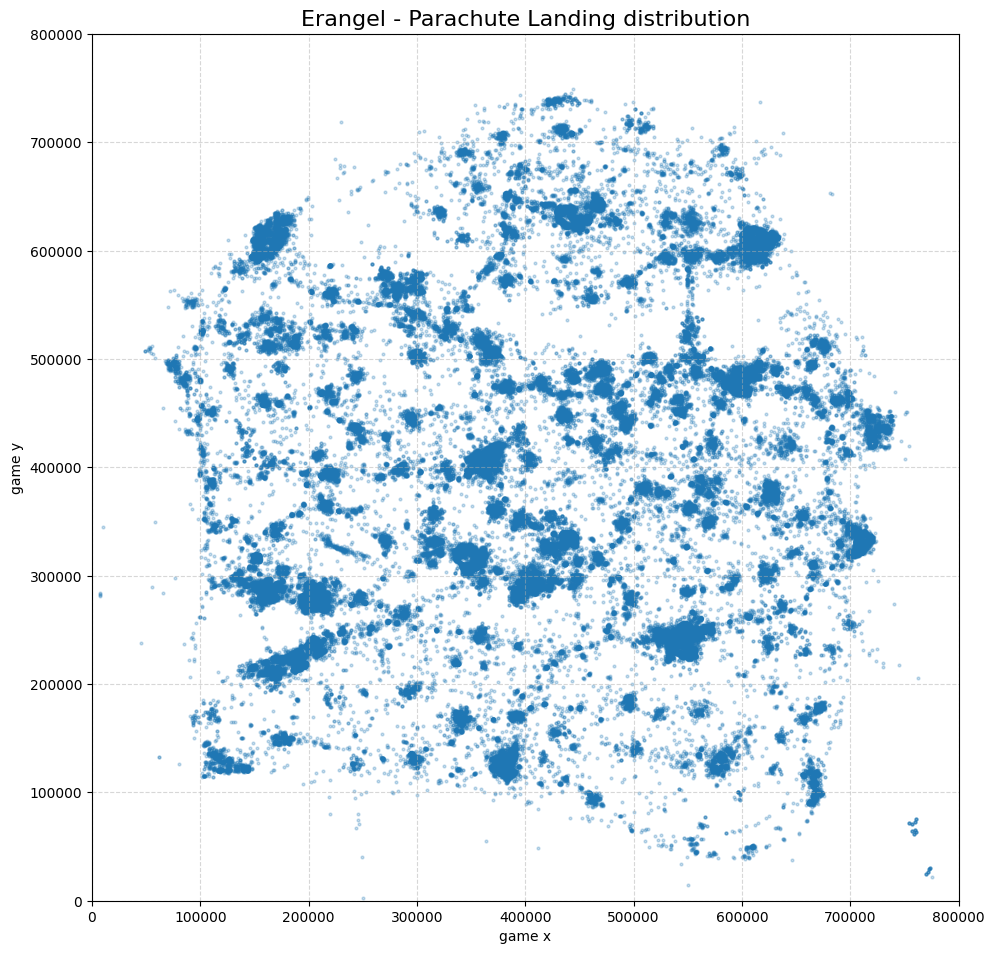

In [23]:
plot_game_coords_with_grid(
    df_parachute,
    "Erangel",
    sample_n=200000,
    alpha=0.25,
    s=4,
    title_suffix="Parachute Landing distribution"
)

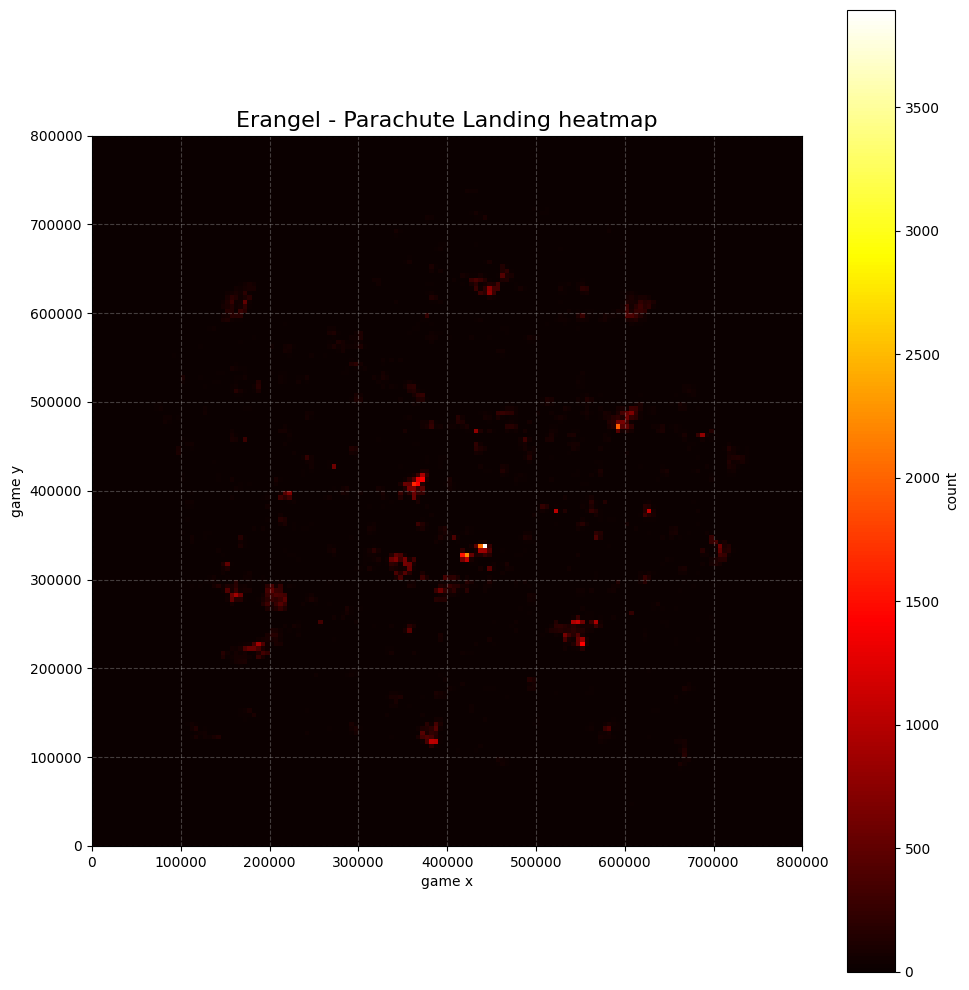

In [19]:
plot_game_heatmap_with_grid(
    df_parachute,
    "Erangel",
    bins=160,
    title_suffix="Parachute Landing heatmap"
)

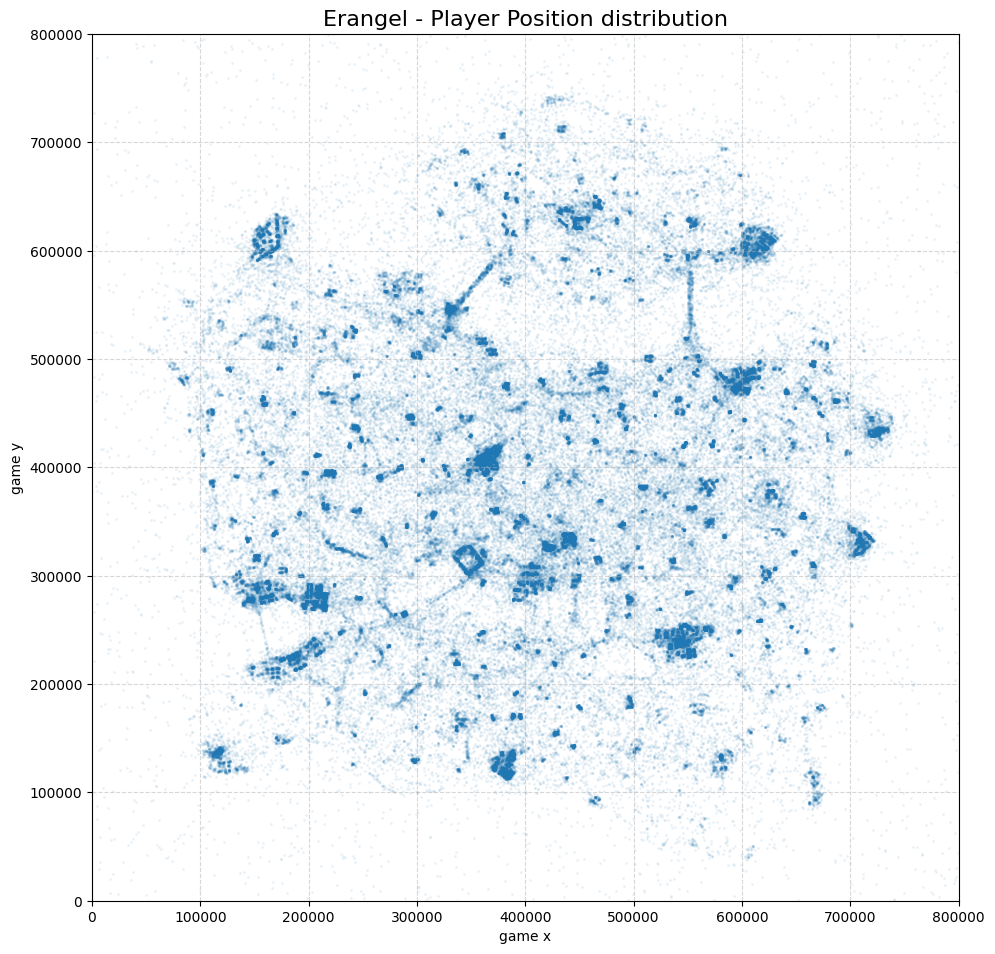

In [24]:
plot_game_coords_with_grid(
    df_position,
    "Erangel",
    sample_n=200000,
    alpha=0.06,
    s=1.5,
    title_suffix="Player Position distribution"
)

In [ ]:
total_erangel = (df_parachute["mapName"] == "Erangel").sum()
sample_n = 1_000_000
pct = sample_n / total_erangel * 100

print("Erangel total rows:", total_erangel)
print("sample_n:", sample_n)
print(f"sample ratio: {pct:.2f}%")

# ## 
# Erangel total rows: 200682
# sample_n: 1000000
# sample ratio: 498.30%

## 따라서 기존 100만개를 넣던 것을 20만개로 줄여야 에란겔 데이터의 100%를 투영하는 것.



Erangel total rows: 200682
sample_n: 1000000
sample ratio: 498.30%


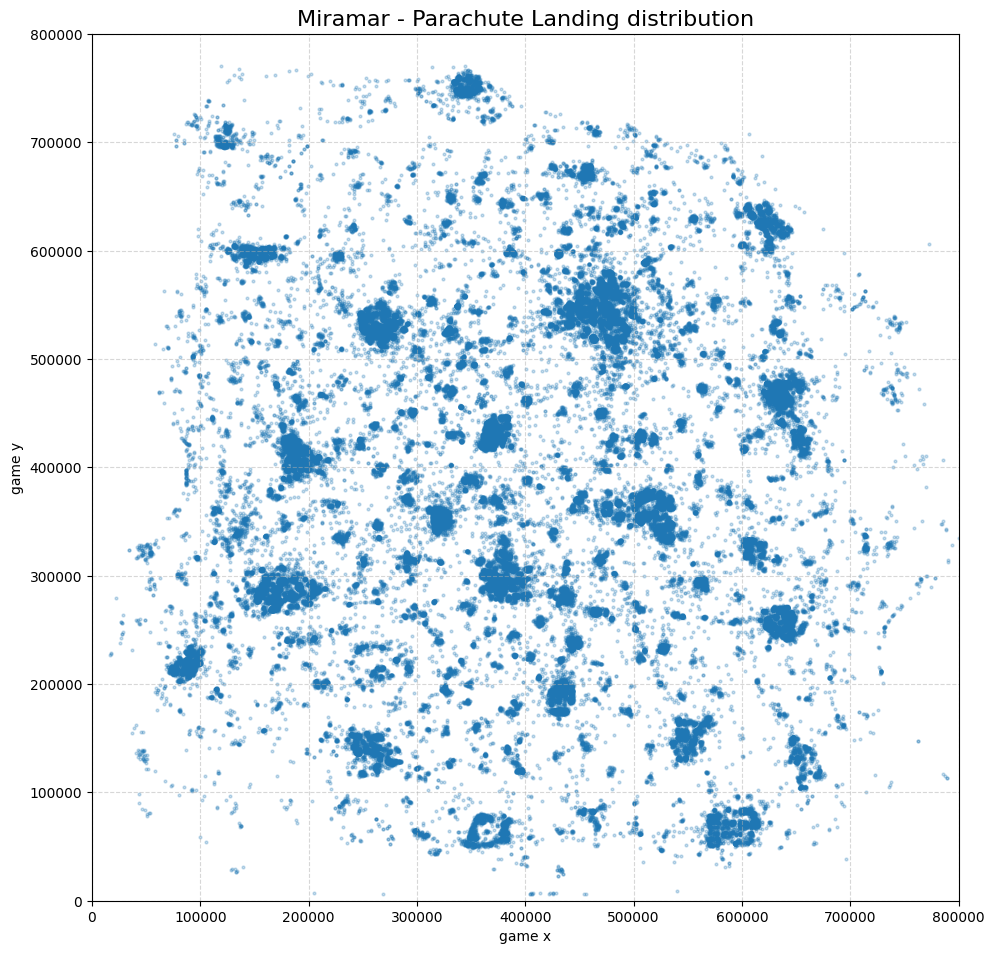

In [32]:
plot_game_coords_with_grid(
    df_parachute,
    "Miramar",
    sample_n=150000,
    alpha=0.25,
    s=4,
    title_suffix="Parachute Landing distribution"
)

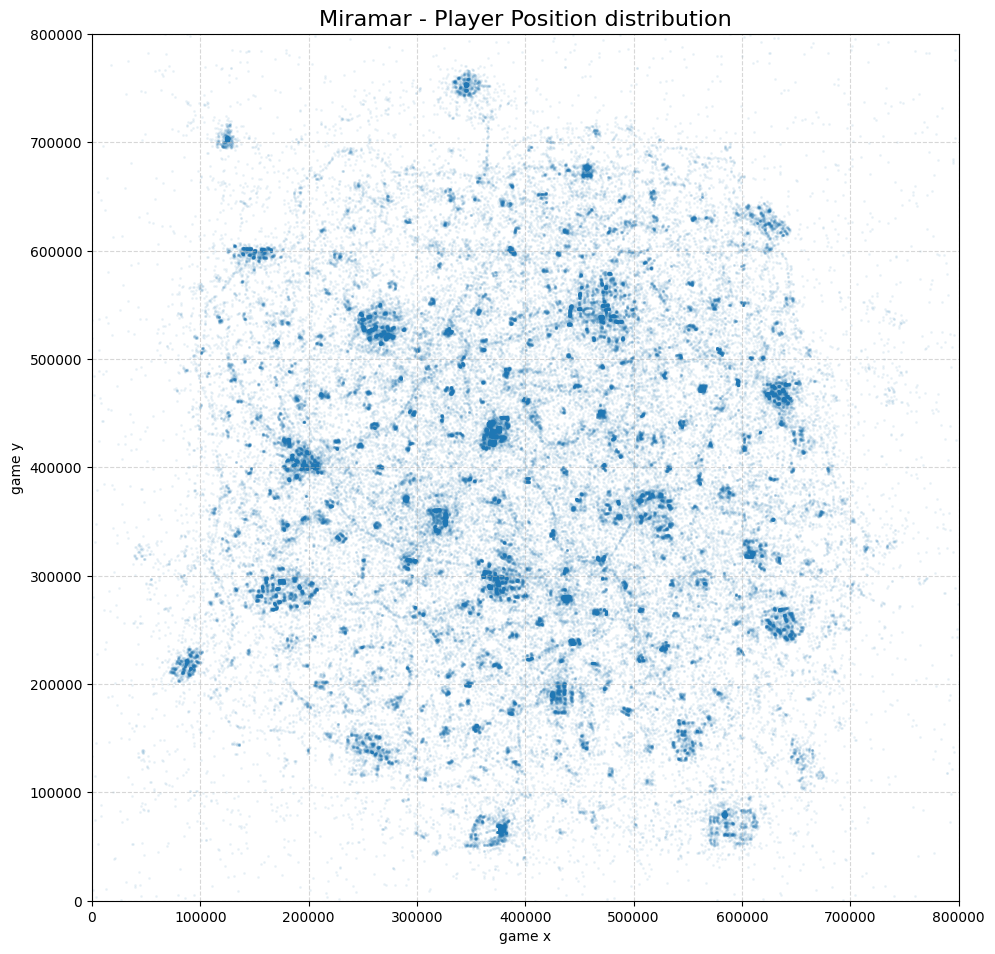

In [33]:
plot_game_coords_with_grid(
    df_position,
    "Miramar",
    sample_n=150000,
    alpha=0.06,
    s=1.5,
    title_suffix="Player Position distribution"
)

In [ ]:
total_erangel = (df_parachute["mapName"] == "Miramar").sum()
sample_n = 1_000_000
pct = sample_n / total_erangel * 100

print("Erangel total rows:", total_erangel)
print("sample_n:", sample_n)
print(f"sample ratio: {pct:.2f}%")

# ## 
# Erangel total rows: 188621
# sample_n: 1000000
# sample ratio: 530.16%

## 따라서 기존 100만개를 넣던 것을 15만개로 줄여야 미라마 데이터의 90% 이상을 투영하는 것.



Erangel total rows: 188621
sample_n: 1000000
sample ratio: 530.16%


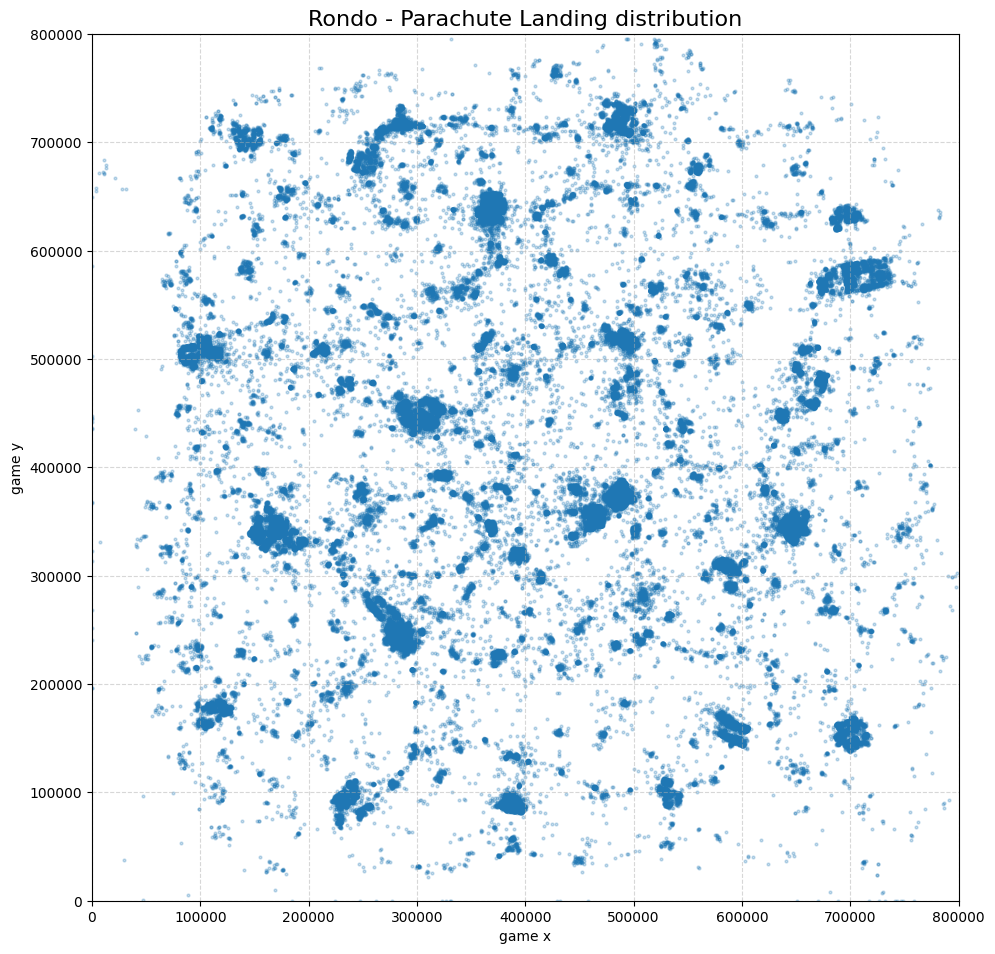

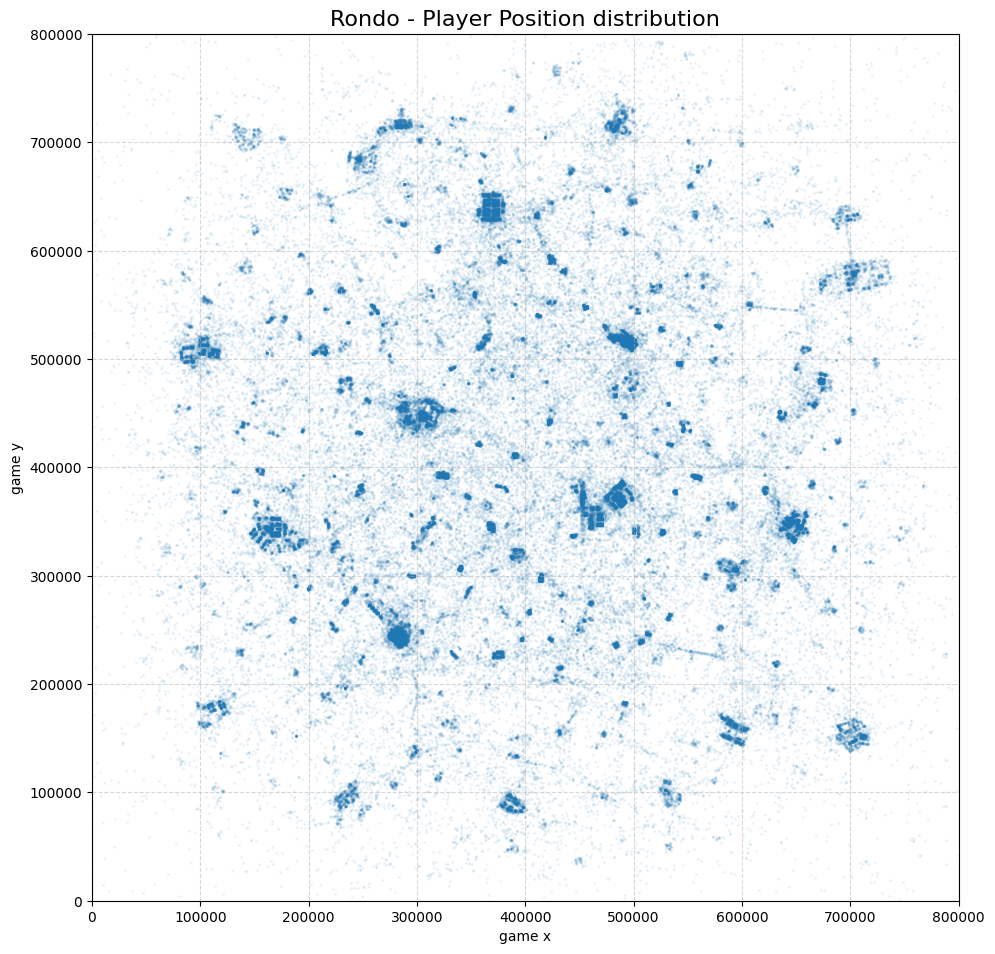

In [34]:
plot_game_coords_with_grid(
    df_parachute,
    "Rondo",
    sample_n=150000,
    alpha=0.25,
    s=4,
    title_suffix="Parachute Landing distribution"
)

plot_game_coords_with_grid(
    df_position,
    "Rondo",
    sample_n=150000,
    alpha=0.06,
    s=1.5,
    title_suffix="Player Position distribution"
)

In [ ]:
total_erangel = (df_parachute["mapName"] == "Rondo").sum()
sample_n = 1_000_000
pct = sample_n / total_erangel * 100

print("Erangel total rows:", total_erangel)
print("sample_n:", sample_n)
print(f"sample ratio: {pct:.2f}%")

# ## 
# Erangel total rows: 163681
# sample_n: 1000000
# sample ratio: 610.94%

## 따라서 기존 100만개를 넣던 것을 15만개로 줄여야 론도 데이터의 90% 이상을 투영하는 것.



Erangel total rows: 163681
sample_n: 1000000
sample ratio: 610.94%


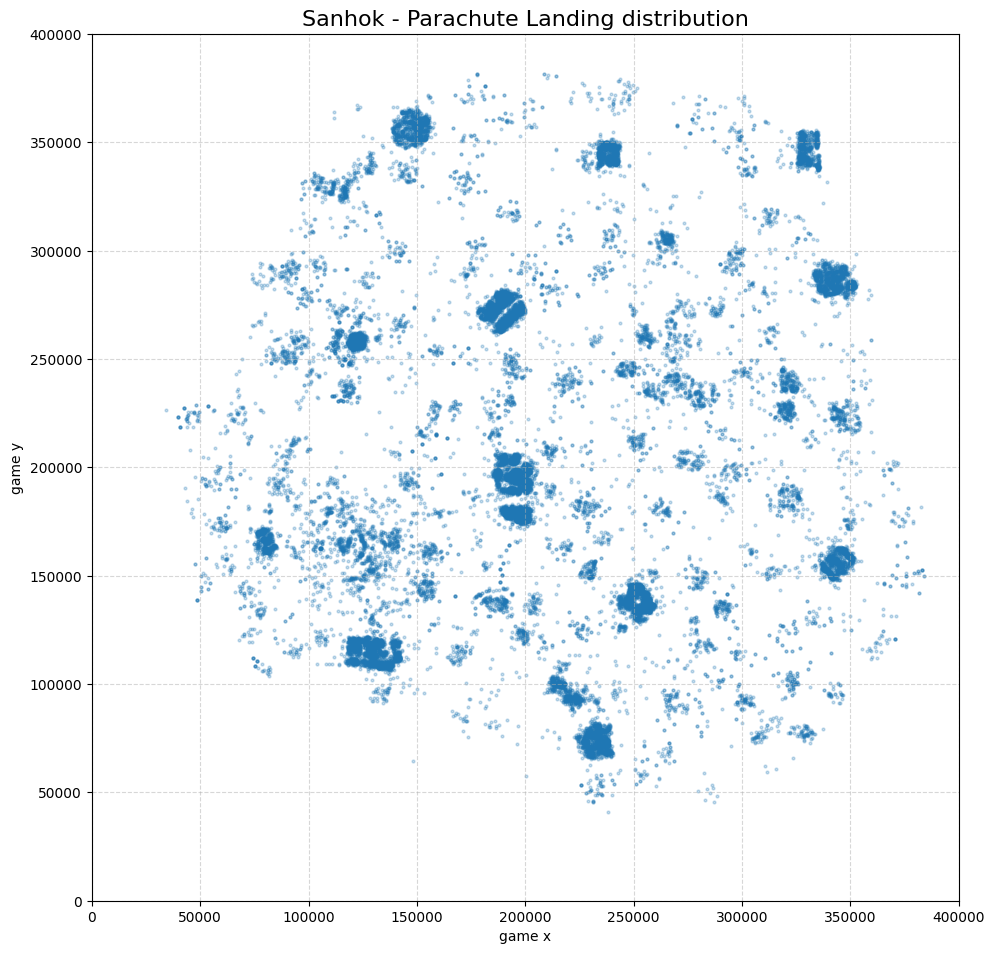

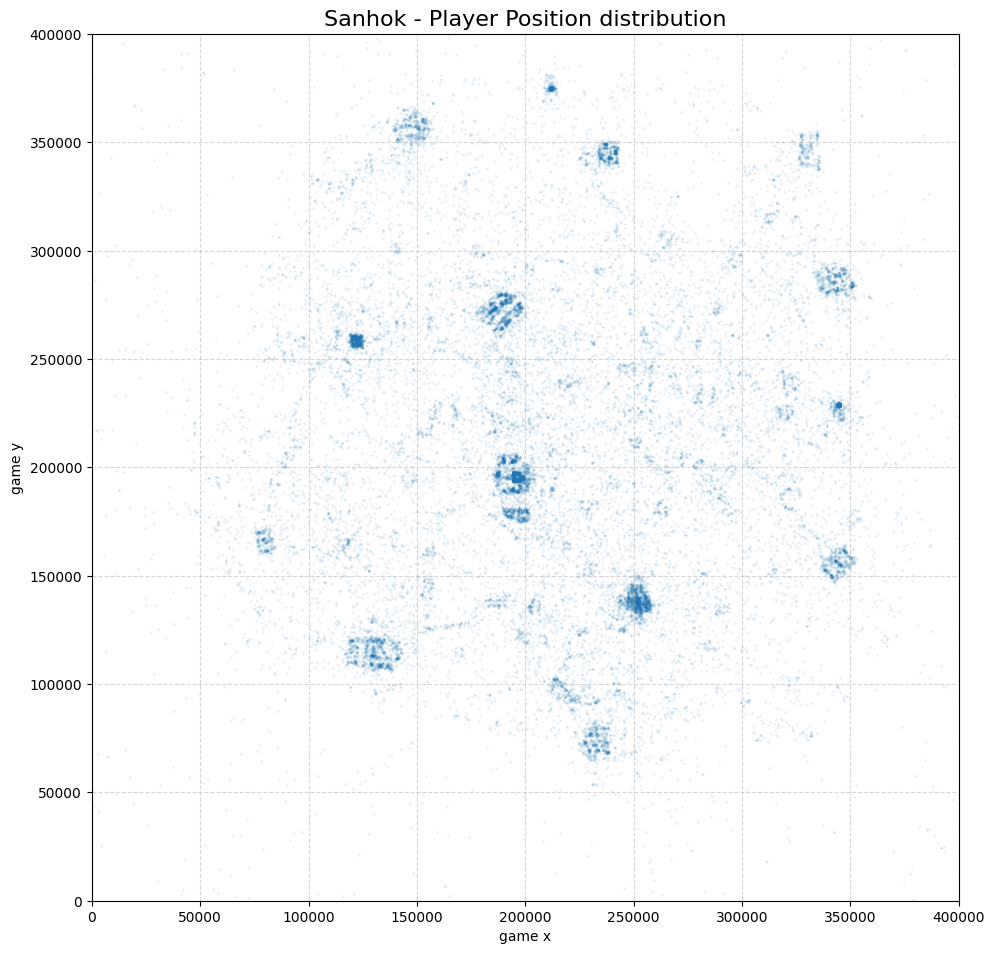

In [38]:
plot_game_coords_with_grid(
    df_parachute,
    "Sanhok",
    sample_n=32000,
    alpha=0.25,
    s=4,
    title_suffix="Parachute Landing distribution"
)

plot_game_coords_with_grid(
    df_position,
    "Sanhok",
    sample_n=32000,
    alpha=0.06,
    s=1.5,
    title_suffix="Player Position distribution"
)

In [ ]:
total_erangel = (df_parachute["mapName"] == "Sanhok").sum()
sample_n = 1_000_000
pct = sample_n / total_erangel * 100

print("Erangel total rows:", total_erangel)
print("sample_n:", sample_n)
print(f"sample ratio: {pct:.2f}%")

# ## 
# Erangel total rows: 32116
# sample_n: 1000000
# sample ratio: 3113.71%

## 따라서 기존 100만개를 넣던 것을 32000개로 줄여야 사녹 데이터의 100% 투영하는 것.



Erangel total rows: 32116
sample_n: 1000000
sample ratio: 3113.71%


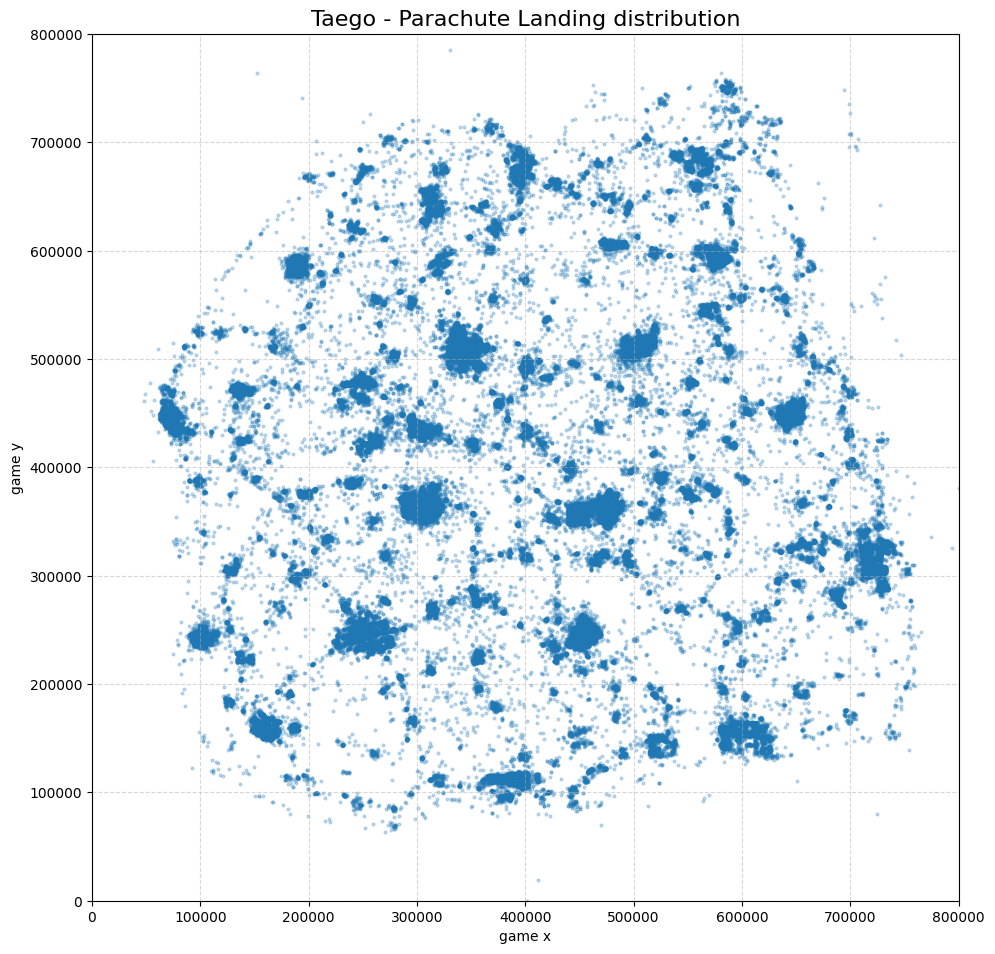

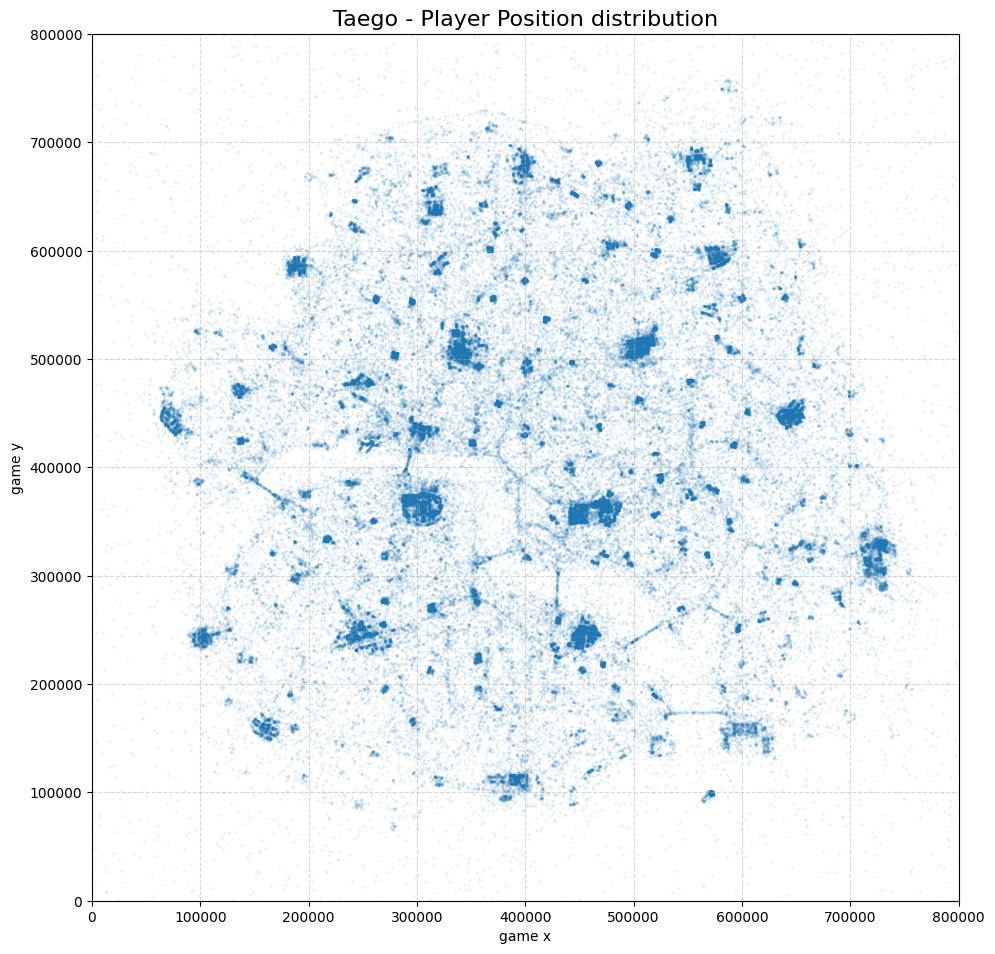

In [41]:
plot_game_coords_with_grid(
    df_parachute,
    "Taego",
    sample_n=180000,
    alpha=0.25,
    s=4,
    title_suffix="Parachute Landing distribution"
)

plot_game_coords_with_grid(
    df_position,
    "Taego",
    sample_n=180000,
    alpha=0.06,
    s=1.5,
    title_suffix="Player Position distribution"
)

In [ ]:
total_erangel = (df_parachute["mapName"] == "Taego").sum()
sample_n = 1_000_000
pct = sample_n / total_erangel * 100

print("Erangel total rows:", total_erangel)
print("sample_n:", sample_n)
print(f"sample ratio: {pct:.2f}%")

# ## 
# Erangel total rows: 188747
# sample_n: 1000000
# sample ratio: 529.81%

## 따라서 기존 100만개를 넣던 것을 18만개로 줄여야 태이고 데이터의 100% 투영하는 것.



Erangel total rows: 188747
sample_n: 1000000
sample ratio: 529.81%


In [13]:
df_master = pd.read_csv("C:/Users/qkrtl/10th/00_Project/04_final/02_parquet_file/04_temp_parquet_files/analysis_output/master.csv")

In [16]:
df_master.columns

Index(['Unnamed: 0', 'matchId', 'mapName', 'gameMode', 'createdAt', 'DBNOs',
       'assists', 'boosts_x', 'damageDealt_x', 'deathType', 'headshotKills',
       'heals_x', 'killPlace', 'killStreaks', 'kills_x', 'longestKill', 'name',
       'playerId', 'revives', 'rideDistance_x', 'roadKills', 'swimDistance',
       'teamKills', 'timeSurvived_x', 'vehicleDestroys', 'walkDistance_x',
       'weaponsAcquired', 'winPlace_x', 'servername', 'currentRankPoint',
       'game_type', 'tier', 'accountId', 'rotation_timing_score',
       'vehicle_use_ratio', 'bluezone_exposure_ratio',
       'safezone_proximity_mean', 'safezone_edge_ratio', 'altitude_variance',
       'survival_time', 'total_movement', 'drop_distance_from_path', 'drop_x',
       'drop_y', 'early_enemy_density', 'max_vehicle_distance', 'kills_y',
       'damageDealt_y', 'winPlace_y', 'win_flag', 'top3_flag',
       'timeSurvived_y', 'walkDistance_y', 'rideDistance_y', 'heals_y',
       'boosts_y', 'kill_rate', 'move_speed', 'heal_